<img src='img/banner.png' align='right' width='100%'></img>

<div class="alert alert-block alert-success">
<b>PREREQUISITE </b><br>
    
For smooth experience some actions are needed:
* It is expected for user to be familiar with Python
* It is expected, that **MSG MDFAPAR** product data is downloaded from [LSA SAF data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/MSG/MDFAPAR/NETCDF/) in `NetCDF4` format for May 1, 2023 and saved locally
* It is expected, that **MSG MDFVC** product data is downloaded from [LSA SAF data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/MSG/MDFVC/NETCDF/) in `NetCDF4` format for the period from March 1, 2023 to October 31, 2023 and saved locally.

</div>



<hr>

# Demonstration of MSG Based LSA SAF Vegetation Products

#### About

The aim of this notebook is to highlight specific LSA SAF vegetation products. These products offer valuable insights into the condition of vegetation, making them indispensable for studying the impacts of weather, extreme weather events (such as droughts), pollution, and other factors on plant life.

- **Leaf Area Index (LAI)** is a parameter, that describes plant canopies. It is dimensionless (m²/ m²) and is defined as $\frac{1}{2}$ of the total green leaf area (one-sided) in a vertical column, divided by the unit horizontal ground surface area in the same column. Values are in the range between 0 (bare ground) and 7 (dense forests).
  
- **Fraction of Absorbed Photosynthetic Active Radiation (FAPAR)** describes a fraction of photosynthetically active radiation, that is absorbed in plants. Photosynthetically active radiation is defined as a light with wavelength between 400 and 700 nm. Therefore FAPAR represents a direct measure of the photosynthetic activity and has an important role in studying carbon-cycle and the vegetation on a global scale. It ranges between 0 (no absorption) and 1 (total absorption).
  
-  **Fraction of Vegetation Cover (FVC)** is an index, that describes the amount of vegetation distributed in the horizontal perspective. It is defined as a fraction of the ground covered with vegetation. It is a very useful measure for estimating the overall amount and condition of the vegetation.

All these indices are available as LSA SAF daily products based on the Meteosat Second Generation (MSG) data. The LSA SAF MSG based products include Leaf Area Index (MDLAI), Fraction of Absorbed Photosynthetic Active Radiation (MDFAPAR), Fraction of Vegetation Cover (MDFVC). The full list of products is available on [LSA SAF webpage](https://landsaf.ipma.pt/en/data/products/vegetation/). All these products provide multiple variables, an estimate for the corresponding vegetation index, an estimate for the uncertainty (standard error) and a quality flag of the measurement.

We will demonstrate how to work with the products (in the form of `NetCDF4` files) and prepare simple representations, either as a plot or as an animation. The two ways of accessing the data will be presented. Firstly, the use of locally saved data is presented. The data can be loaded from the [LSA SAF data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/) using one of the approaches described [here](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/home).

Secondly, the use of the [THREDDS Data Server](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/data/thredds) is also demonstrated. THREDDS uses OpeNDAP protocol, which allows accessing the saved data remotely as well as only downloading a subset of the `NetCDF4` files. The advantage of this approach is less disk space needed, but on the downside loading the data takes more time.

#### How to access the data

For this example, we will show how to plot FAPAR and FVC estimations. All measurements are available as NetCDF4 as well as HDF5 files, but only the former files will be used here.

The LSA SAF products files can be downloaded from the [data server](https://datalsasaf.lsasvcs.ipma.pt/PRODUCTS/) available at https://datalsasaf.lsasvcs.ipma.pt/ with prior registration.
Data can be downloaded in various ways, for instance manually, using approach published on [lsasaf_data_access GitLab](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/blob/main/examples/webdav/webdav_colab_example.ipynb) repository or using [WebDAV protocol](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/data/webdav).An additional option is to use the `GNU Wget` program.

LAI product files are accessed from the THREDDS data server and consequently do not need to be manually downloaded.

#### Basic facts on the LSA SAF MDFAPAR, MDLAI and MDFVC
> **Product number**: LSA-425 (MDFAPAR); LSA-423 (MDLAI); LSA-421 (MDFVC)
>
> **Spatial resolution**: 3km at nadir
> 
> **Spatial coverage**: MSG-Disk
> 
> **Time steps**: 15 min
> 
> **Data availability**: from 2016 (before 2016 available as climate data records)
> 

#### Module outline:
* [1 - The LSA SAF MDFAPAR Product](#First)
* [2 - The LSA SAF MDLAI Product](#Second)
* [3 - The LSA SAF MDFVC Product](#Third)

<hr>

#### Load required libraries

In [1]:
import numpy as np                                  # a library that lets us work with arrays; we import this with a new name "np"
import pandas as pd                                 # a library for time series analysis
import datetime as dt                               # a library that allows us to work with dates and times
import xarray as xr                                 # a library that helps us work efficiently with multi-dimensional arrays

import matplotlib.pyplot as plt                     # a library that provides plotting capability
from matplotlib.ticker import FuncFormatter         # FuncFormatter allows you to define custom tick label formatting functions for your plots.
from matplotlib.animation import FuncAnimation      # is a class that allows the creation of animation. It involves plotting the initial figure, including all the required artists.

import cartopy                                      # a library that supports mapping and projection
import cartopy.crs as ccrs                          # a library that supports mapping and projection 
import cartopy.feature as cf                        # a cartopy extension that support adding features, e.g. coastlines
from IPython.display import HTML                    # a module to handle animations with jupyter notebooks. 
from matplotlib import rcParams                     # a dictionary-like object that stores default settings for matplotlib plots, allowing users to customize various properties. 

#### Define Utility Functions

In this section, we will define some functions, that will be used for plotting. We will plot multiple maps in Plate Carrèe projection. Firstly, we will define `custom_latitude_formatter()` and `custom_longitude_formatter()`, which return custom ticks for our plots. In our case, we want a North-South, East-West system instead of positive and negative latitudes and longitudes. This function will not be directly used by the user, but will be called by the `Axis.set_major_formatter()`.

In [2]:
# Define a custom tick formatter function for latitude
def custom_latitude_formatter(x, pos):
    if x >= 0:
        return f"{x}˚ N"
    else:
        return f"{abs(x)}˚ S"

# Define a custom tick formatter function for longitude
def custom_longitude_formatter(y, pos):
    if y >= 0:
        return f"{y}˚ E"
    else:
        return f"{abs(y)}˚ W"

Next, we will define `prepare_plot()` function, that will set up properties of our plot, without actual plotting (for instance setting up labels, grid, etc.). The function takes the title of the plot as an argument.

In [3]:
def prepare_plot(grid_step=10, title=None):
    '''
    Function, that defines figure and axes object and returns them
    It also sets grid, ticks, title and adds ocean, coastlines and borders.
    Inputs:
     - grid_step: (float) defines distance between grid lines in degrees
     - title: (str) defines title of the plot
     Outputs
     - Figure
     - Axes
    '''
    #Define fontsize
    fontsize=14

    # Define color for nan values
    nan_color="slategray"

    # Get a handle on the figure and the axes
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()},
                            figsize=(12, 7),
                            facecolor='white')
    
    #Defines position of gridlines
    grid_xrange=range(-180,180,grid_step)
    grid_yrange=range(-90,90,grid_step)

    # Gridlines are set
    grid_lines=ax.gridlines()
    grid_lines.xlocator=plt.FixedLocator(grid_xrange)
    grid_lines.ylocator=plt.FixedLocator(grid_yrange)

    # Ticks are set
    ax.set_xticks(grid_xrange, crs=ccrs.PlateCarree())
    ax.set_yticks(grid_yrange, crs=ccrs.PlateCarree())
    ax.xaxis.set_major_formatter(FuncFormatter(custom_longitude_formatter))
    ax.yaxis.set_major_formatter(FuncFormatter(custom_latitude_formatter))
    ax.tick_params(axis="both", labelsize=fontsize)

    # Ocean is defined and added
    ocean50 = cartopy.feature.NaturalEarthFeature('physical', 'ocean',
                                                   scale='50m', edgecolor='none', facecolor='lightblue')
    ax.add_feature(ocean50)

    # Coastlines and borders are added
    ax.coastlines()
    ax.add_feature(cf.BORDERS)

    # Set face color
    ax.set_facecolor(nan_color)

    # Axis labels are added
    ax.set_xlabel('Longitude',fontsize=fontsize)
    ax.set_ylabel('Latitude',fontsize=fontsize)
    ax.set_title(title,fontsize=fontsize)

    return fig, ax

### <a id='First'></a>1. The LSA SAF MDFAPAR Product

In this demonstration, we will showcase the **LSA SAF MDFAPAR product**. It is assumed, that the MDFAPAR `NetCDF4` file `NETCDF4_LSASAF_MSG_FAPAR_MSG-Disk_202305010000.nc` for 1 May 2023 is pre-downloaded and available on the local directory. We will first set the directory where the file is located.

In [4]:
FAPAR_Location="Data_FAPAR/"

Then we can define the `xarray` dataset and look at the content of the `NetCDF4` file:

In [5]:
FAPAR_dataset=xr.open_dataset(FAPAR_Location+"NETCDF4_LSASAF_MSG_FAPAR_MSG-Disk_202305010000.nc")
print(FAPAR_dataset)

<xarray.Dataset> Size: 246MB
Dimensions:         (time: 1, lat: 3201, lon: 3201)
Coordinates:
  * lat             (lat) float32 13kB 80.0 79.95 79.9 ... -79.9 -79.95 -80.0
  * lon             (lon) float32 13kB -80.0 -79.95 -79.9 ... 79.9 79.95 80.0
  * time            (time) datetime64[ns] 8B 2023-05-01
Data variables:
    FAPAR           (time, lat, lon) float64 82MB ...
    crs             |S1 1B ...
    quality_flag    (time, lat, lon) float64 82MB ...
    standard_error  (time, lat, lon) float64 82MB ...
Attributes: (12/27)
    date_created:               2023-05-02T00:25:34Z
    algorithm_version:          2.0.0
    base_algorithm_version:     3.0.1
    processing_level:           03
    platform:                   MSG3
    sensor:                     SEVI
    ...                         ...
    westernmost_longitude:      80.0
    spatial_resolution:          0.05x 0.05
    geospatial_lat_units:       degrees_north
    geospatial_lon_units:       degrees_east
    Conventions:   

We are using the MDFAPAR product in the `NetCDF4` format. The data has three dimensions (latitude, longitude, time), although the time dimension contains only one value. Furthermore, we can review all of the attributes stored in the `NetCDF4` file. The simplest option to plot estimated FAPAR values is to use `xarray.DataSet.plot()`.

To access values of the FAPAR product at specific subset area of interest in lat-lon grid we use the `DataSet.sel()` method.

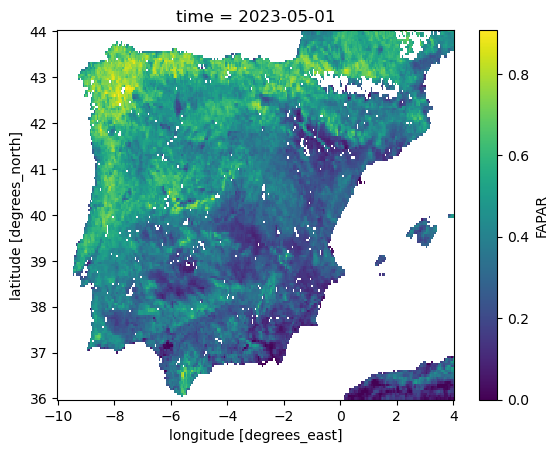

In [6]:
# Chose only locations of interest
FAPAR_dataset=FAPAR_dataset.sel(lat=slice(44, 36), lon=slice(-10, 4))

# Chose DataArray "FAPAR" from DataSet and plot it
FAPAR_dataset.FAPAR.plot()

In order to further customize the visual aspects of the plot, we will present one way of doing so. We will utilize `xarray.DataArray.values` which returns a numpy array with values, which can be then plotted with `pyplot`.

In the next step, we extract a 2D `numpy array` of FAPAR values from the dataset and two 1D arrays with latitude and longitude coordinates.

In [7]:
# Extract FAPAR lat/lon and LAI values
FAPAR_latitudes=FAPAR_dataset.lat.values
FAPAR_longitudes=FAPAR_dataset.lon.values
FAPAR_values=FAPAR_dataset.FAPAR.values[0,:,:]

A contour plot of FAPAR values in a 2D array is plotted utilizing the `pyplot.contour()` function. For comparison `pyplot.pcolormeash()`, which plots the values of each pixel, is used in the next example. The contour plot offers a smoothed visualization, compared to the raster image produced by the `pcolormesh()` method.

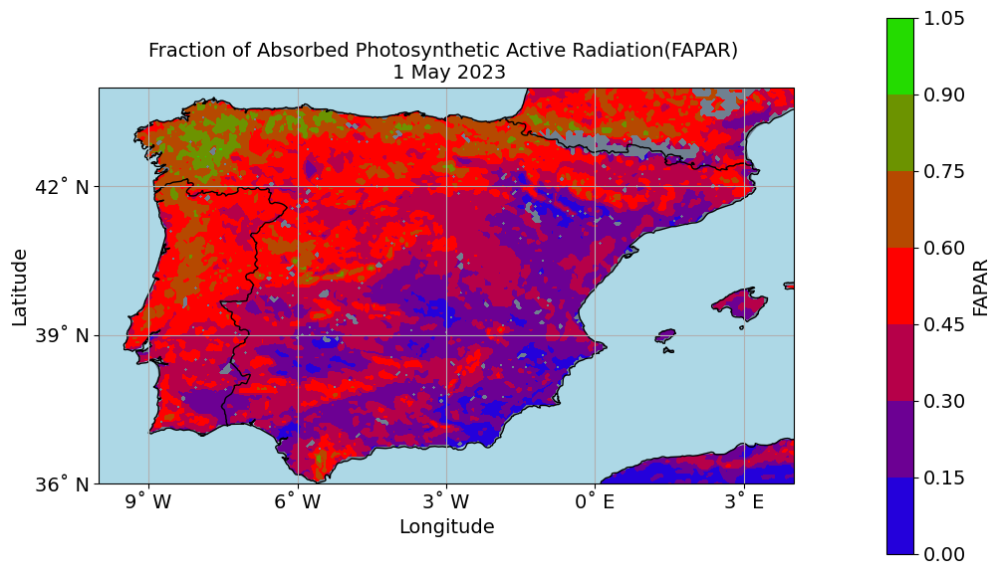

In [8]:
# Set colormap and fontsize
colormap="brg"
fontsize=14

# Set fig
fig, ax=prepare_plot(
    grid_step=3,
    title="Fraction of Absorbed Photosynthetic Active Radiation(FAPAR) \n 1 May 2023"
    )

# Plot the data
im=ax.contourf(FAPAR_longitudes, FAPAR_latitudes,FAPAR_values, cmap=colormap)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.1)
cbar.set_label(label="FAPAR", size=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

# Set extent
ax.set_extent([-10,4,36,44], crs=ccrs.PlateCarree())

The resulting plot shows the FAPAR values measured over the Iberian Peninsula on 1 May 2023. It shows the highest values of photosynthetic activity in the north-eastern part of the peninsula while there are some areas (indicated with blue color) with almost no photosynthetic activity. They are concentrated near the Mediterranean coast and in the central parts of the peninsula. Some areas (particularly the Pyrenees) are marked with grey color indicating, that the FAPAR was not estimated there (`NaN` value.)

### <a id='Second'></a>2. The LSA SAF MDLAI Product

In this section, an example of LSA SAF MDLAI product daily values for 1 May 2023, is shown. MDLAI product is organized in a similar manner as MDFAPAR in terms of file type and structure.

This time we will access the data from the [LSA SAF THREDDS server](https://thredds.lsasvcs.ipma.pt/) server via [OpenDAP protocol](https://gitlab.com/helpdesk.landsaflsasaf_data_access/-/wikis/data/thredds) instead of using locally saved data. THREDDS data server is currently in the demonstration phase.
It allows access of the whole `NetCDF4` file as well as a specific subset of `NetCDF4` file, for instance only a 2D (lat-lon) area or a list of points.

In order to access the data, one needs to [register](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/credentials/register). The examples on how to access the THREDDS server are available [here](https://gitlab.com/helpdesk.landsaf/lsasaf_data_access/-/wikis/data/thredds), while the documentation is available [here](https://www.unidata.ucar.edu/software/tds/). A catalog of products data is accessible with a prior registration [here](https://thredds.lsasvcs.ipma.pt/thredds/catalog/catalog.html).

In general, one can use `xarray.open_dataset()` to access the THREDDS data. The location of the dataset needs to be specified as follows: `https://<USERNAME>:<PASSWORD>@thredds.lsasvcs.ipma.pt/thredds/dodsC/<satellite>/<product>/<format>/<year>/<month>/<day>/filename`.

Following is an example of accessing the MDLAI product data for the 1 May 2023. We start by inputting our username and password:

In [9]:
USER="***"
PASSWD="***"

Then we define our `xarray.DataSet`. The `xarray` library uses "lazy loading", therefore the data will be loaded only when we will use `DataSet.load()` or call the data in the dataset.

In [10]:
LAI_dataset=xr.open_dataset("https://"
            +USER
            +":"
            +PASSWD
            +"@thredds.lsasvcs.ipma.pt/thredds/dodsC/MSG/MDLAI/NETCDF/2023/05/01/NETCDF4_LSASAF_MSG_LAI_MSG-Disk_202305010000.nc")
print(LAI_dataset)

<xarray.Dataset> Size: 246MB
Dimensions:         (lat: 3201, lon: 3201, time: 1)
Coordinates:
  * lat             (lat) float32 13kB 80.0 79.95 79.9 ... -79.9 -79.95 -80.0
  * lon             (lon) float32 13kB -80.0 -79.95 -79.9 ... 79.9 79.95 80.0
  * time            (time) datetime64[ns] 8B 2023-05-01
Data variables:
    crs             |S64 64B ...
    LAI             (time, lat, lon) float64 82MB ...
    quality_flag    (time, lat, lon) float64 82MB ...
    standard_error  (time, lat, lon) float64 82MB ...
Attributes: (12/29)
    references:                      Data provided by the EUMETSAT Satellite ...
    easternmost_longitude:           -80.0
    westernmost_longitude:           80.0
    spatial_resolution:               0.05x 0.05
    geospatial_lat_units:            degrees_north
    geospatial_lon_units:            degrees_east
    ...                              ...
    geospatial_lat_resolution:        0.05
    geospatial_lon_resolution:        0.05
    northernmost_lat

From this point onwards, we will do everything in the same manner as in the previous example. Bear in mind, that the data stored in the `NetCDF4 file` will be loaded only in the next step due to the lazy loading:

In [11]:
# Choose only locations of interest
LAI_dataset=LAI_dataset.sel(lat=slice(40, -40), lon=slice(-20, 60))

# Extract LAI lat/lon and LAI values
LAI_latitudes=LAI_dataset.lat.values
LAI_longitudes=LAI_dataset.lon.values
LAI_values=LAI_dataset.LAI.values[0,:,:]

In the final step, we are going to make our plot. We can use the function `prepare_plot()` defined in the previous section, with the exception, that we pass a different title and grid step size since the plot will be a slightly larger, therefore greater steps between grid lines are required.

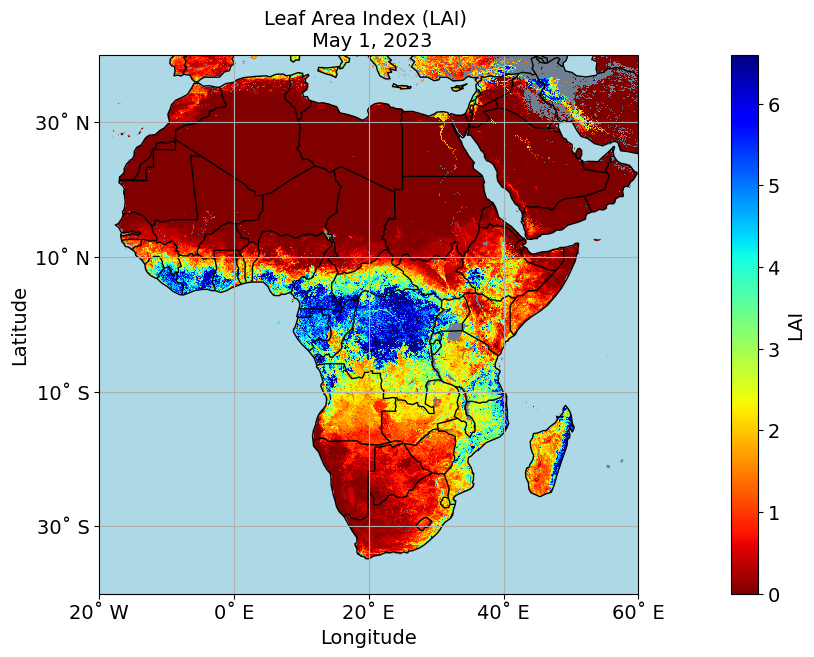

In [12]:
# Set colormap and fontsize
colormap="jet_r"
fontsize=14

# Set fig
fig, ax=prepare_plot(grid_step=20, title="Leaf Area Index (LAI) \n May 1, 2023")

# Plot the data
im=ax.pcolormesh(LAI_longitudes, LAI_latitudes,LAI_values, cmap=colormap)

# Add colorbar
cbar = plt.colorbar(im, ax=ax, orientation='vertical', pad=0.1)
cbar.set_label(label="LAI", size=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

# Set extent
ax.set_extent([-20,60,-40,40], crs=ccrs.PlateCarree())

The resulting plot shows LAI estimates over Africa on 1 May 2023. Multiple deserted areas completely without vegetation can be identified. The highest LAI values are present in the areas with Tropical forests, for instance, the Kongo basin and the coast of the Gulf of Guinea. Furthermore, some smaller fertile areas within otherwise desert areas can be identified, such as the Nile delta and Lake Chad.

### <a id='Third'></a>3. The LSA SAF MDFVC Product

This section is providing an overview of the LSA SAF MDFVC product, focusing on the spring, summer, and early autumn of 2023 in Europe. The product values are presented as an animation produced with `matplotlib.FuncAnimation()`.

MDFVC product is organized in a similar manner as MDFAPAR and MDLAI in terms of file type and structure.

It is assumed, that the MDFVC `NetCDF4` files are already saved locally.  In the first step, we set the directory where the files are located.

In [13]:
FVC_LOCATION="Data_FVC/"

Then we need to define a list of `datetime` objects in the period between March and October 2023.
The goal is to prepare an animation of FVC values for this period. To limit the number of FVC frames, only every 10th file is used in the animation.

In [14]:
# Start and end date are set
start_date=dt.datetime(2023, 3, 1, 0, 0, 0)
end_date=dt.datetime(2023, 10, 31, 0, 0, 0)

# A list of days of interest is generated
date_range=pd.date_range(start_date,end_date-dt.timedelta(days=1),freq='10d')

# Area of interest is defined 
LAT_SLICE=slice(55.0, 34.0)
LON_SLICE=slice(-10, 20)

# We can check the list of dates of the interest
print(date_range)

DatetimeIndex(['2023-03-01', '2023-03-11', '2023-03-21', '2023-03-31',
               '2023-04-10', '2023-04-20', '2023-04-30', '2023-05-10',
               '2023-05-20', '2023-05-30', '2023-06-09', '2023-06-19',
               '2023-06-29', '2023-07-09', '2023-07-19', '2023-07-29',
               '2023-08-08', '2023-08-18', '2023-08-28', '2023-09-07',
               '2023-09-17', '2023-09-27', '2023-10-07', '2023-10-17',
               '2023-10-27'],
              dtype='datetime64[ns]', freq='10D')


In the next cell, we define the update function, which takes a `datetime` object as an input, then accesses the locally saved `NetCDF4` file and returns a `DataSet` with FVC values only .

In [15]:
def update_data(date):
    '''
    Function returns FAI dataset. The area is defined in a global variable.
    '''
    # The next dataset is defined, but not loaded
    next_ds=xr.open_dataset("Data_FVC/NETCDF4_LSASAF_MSG_FVC_MSG-Disk_"
                                +str("{:02d}".format(date.year))
                                +str("{:02d}".format(date.month))
                                +str("{:02d}".format(date.day))
                                +"00"
                                +"00"
                                +".nc")
    
    # The next datased is loaded
    next_ds=next_ds.sel(lat=LAT_SLICE, lon=LON_SLICE)['FVC'].load()
    next_np=next_ds.values[0,:,:]


    time_coords = next_ds['time'].values
    lat_coords = next_ds['lat'].values
    lon_coords = next_ds['lon'].values   
    
    # Current dataset is closed, to fee the memorry, maximum is saved in numpy array
    next_ds.close()


    #LAI dataset is produced
    fvc_ds=xr.Dataset(
        data_vars={"FVC" : (["time", "lat","lon"], next_np[np.newaxis,:,:])},
        coords={
            "time" : time_coords,
            "lat": (["lat"], lat_coords, {"units": "degrees_north"}),
            "lon" : (["lon"], lon_coords, {"units": "degrees_east"})
            },
    )


    # The dataset is returned as an function output
    return fvc_ds.FVC

We define the `figure` and set up the plot using the `prepare_plot()` function, as defined before. The animation is made using `FunctionAnimation` which essentially updates the data (FVC values) on the plot, but leaves other elements of the plot unchanged. Therefore, we start with plotting the first frame.

The `%%capture` command in `jupyter` is important as it prevents displaying the half-finished plot in the current cell. The whole animation will be finished and displayed in the next cell.

In [16]:
%%capture

# There is a default limit on animation size (21 MB). This needs to be adjusted.
rcParams['animation.embed_limit'] = 100.0 

# Define fontsize and colormap
fontsize = 14
colormap="gist_earth_r"

# Figure is defined
fig, ax= prepare_plot()

# Data for the first frame are plotted
first_frame_dataset=update_data(date_range[0])
first_frame_values=first_frame_dataset.values[0,:,:]#.flatten()
first_frame_lon=first_frame_dataset.lon.values
first_frame_lat=first_frame_dataset.lat.values

# The first frame is plotted
cax=ax.pcolormesh(first_frame_lon, first_frame_lat, first_frame_values, cmap=colormap)

# Colorbar is added
cbar = plt.colorbar(cax, ax=ax, orientation='vertical', pad=0.1)
cbar.set_label(label="FVC", size=fontsize)
cbar.ax.tick_params(labelsize=fontsize)

# Title is added
plt.suptitle("Fractional vegetation cover (FVC)",
             fontsize=fontsize)

In the last step, we create an animation. We define a function `animate()`, which adapts the presented plot with the `.set_array()` method. It also changes the title and sets the extent of the plotting.

Animation is presented in the Jupyter Notebook using `HTML(ani.to_jshtml())`. It can be also saved locally by making use of the `ani.save()` command.

In [17]:
# Define a function that updates the color mesh values
def animate(frame):
    cax.set_array(update_data(date_range[frame]).values[0,:,:].flatten())
    ax.set_title("Date: " + date_range[frame].strftime('%d.%m.%Y'), fontsize=fontsize)
    ax.set_extent([-10,20,35, 55], crs=ccrs.PlateCarree())

# Make animation
ani = FuncAnimation(
    fig,             # figure
    animate,         # Name of the update function
    frames=len(date_range),       # Number of frames
    interval=200     # ms between frames
)

# Close the last frame of the animation
plt.close(fig)

# Save animation 
ani.save("FVC_Europe.gif")

# Animation is shown within the Jupyter Notebook
HTML(ani.to_jshtml())

The animation shows the development of vegetation in Europe during the growth season of 2023. Dark blue areas indicate the areas with the highest amount of vegetation, and white areas have no detected vegetation at all. Grey areas indicate missing data (`NaN` values). Vegetation started developing at the end of March near the French Atlantic coast and then central Europe and peaked at the end of May. It can be also seen, that vegetation peaks later in alpine regions for instance in July in the Alps and the Pyrenees.

#### Conclusion

We demonstrated how to access a suite of vegetation products from the LSA SAF (FAPR, LAI and FVC) by means of direct download of datasets and through the THREDDS data server.

We demonstrate various geospatial plots and animations for different areas of the MSG disk. Furthermore, we plotted FAPAR in Europe and LAI in Africa for 1 May 2023. We demonstrated plotting using `pyplot` `pcolormesh` and `contur` plots. We also shoved the FVC in Europe during the growth period in 2023 as an animation made with `matplotlib`.

#### References:

* array Developers (2023). xarray User Guide. [https://docs.xarray.dev/en/stable/user-guide/index.html](https://docs.xarray.dev/en/stable/user-guide/index.html). Accesed: 20.2.2023
